# Projet 6 : Classez des images à l'aide d'algorithmes de Deep Learning

## Contexte

Afin d'aider une association de protection des animaux, il est demandé de classer les images de la base de données de l'association dans le but de déterminer la race des chiens sur les images

## Démarches

Pour réaliser la demande de l'association nous procédons en plusieurs étapes :

- téléchargement des images
- test des différentes corrections appliquables
- création d'un réseau de neurones simple
- test de transfer learning à partir de différents modèles

Le modèle le plus performant sera ensuite déployé dans un code afin de faciliter son utilisation.

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


## Packages Python

In [ ]:
!pip install xmltodict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import tarfile
import os
import numpy as np
import pandas as pd
import PIL.Image
import cv2 
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from PIL.ImageOps import autocontrast, equalize
from PIL import ImageFilter
import matplotlib.pyplot as plt
import xmltodict
from sklearn.preprocessing import LabelEncoder

## Chargement des données

In [ ]:
if tarfile.is_tarfile("/content/gdrive/MyDrive/Projet6/images.tar") :
    tar_images = tarfile.open("/content/gdrive/MyDrive/Projet6/images.tar", 'r')
else : 
    print("Error : /content/gdrive/MyDrive/Projet6/images.tar is not a tar file")

In [ ]:
len(tar_images.getmembers())

20701

In [ ]:
DATA = pd.DataFrame(columns=['path', 'labels', 'image'])
for members in tar_images.getmembers()[0:5000] :
    if members.isfile():
        lab = members.name.split('/')[-2].split('-')[-1]
        fname = '.'.join(members.name.split('/')[-1].split('.')[:-1])
        f = tar_images.extractfile(members)
        DATA = DATA.append({'path':members.name, 'fname' : fname, \
                            'labels':lab,'image':PIL.Image.open(f)}, \
                           ignore_index=True)
tar_images.close()
DATA.head()

,path,labels,image,fname
0,Images/n02085620-Chihuahua/n02085620_10621.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_10621
1,Images/n02085620-Chihuahua/n02085620_10976.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_10976
2,Images/n02085620-Chihuahua/n02085620_11238.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_11238
3,Images/n02085620-Chihuahua/n02085620_11258.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_11258
4,Images/n02085620-Chihuahua/n02085620_11337.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_11337


In [ ]:
print(f"Nombre d'images dans la base de données : {len(DATA)}")

Nombre d'images dans la base de données : 4972


**Lecture des annotations**

Les fichiers d'annotations contiennent des informations sur le format des images et sur la localisation des chiens sur les images.
Pour le moment nous n'avons pas besoin de la localisation des objets et par conséquent nous ne les conservons pas.

In [ ]:
meta_data = pd.DataFrame(columns=['fname', 'width', 'height', 'depth'])
#                                 'segment', 'difficult', 'xmin', 'xmax', 'ymin', 'ymax'])
if tarfile.is_tarfile("/content/gdrive/MyDrive/Projet6/annotation.tar") :
    tar_annot = tarfile.open("/content/gdrive/MyDrive/Projet6/annotation.tar", 'r')
else : 
    print("Error : /content/gdrive/MyDrive/Projet6/annotation.tar is not a tar file")

imax = len(tar_annot.getmembers()[0:5000])
for i, members in enumerate(tar_annot.getmembers()[0:5000]) :
    if members.isfile():
        f = tar_annot.extractfile(members)
        meta = xmltodict.parse(f.read())['annotation']
        fname = members.name.split('/')[-1]
        #fname = meta['filename']
        
        #if len(DATA[DATA['fname'] == fname ]) != 1 :
           # print(f"Error : {fname} is {len(DATA[DATA['fname'] == fname ])} times in the database")
        #tmp = {'fname' : fname, 'segment' : int(meta['segment']), \
        #       'difficult' : int(meta['object']['difficult'])}
        tmp = {'fname' : fname}
        for par in ['width', 'height', 'depth'] :
            tmp[par] = float(meta['size'][par])
        #for par in ['xmin', 'xmax', 'ymin', 'ymax'] :
        #    tmp[par] = int(meta['object']['bndbox'][par])
        meta_data = meta_data.append(tmp, ignore_index=True)
tar_annot.close()

In [ ]:
DATA = pd.merge(DATA, meta_data, on='fname', how="outer")
del meta_data
DATA.head()

,path,labels,image,fname,width,height,depth
0,Images/n02085620-Chihuahua/n02085620_10621.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_10621,500.0,298.0,3.0
1,Images/n02085620-Chihuahua/n02085620_10976.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_10976,322.0,484.0,3.0
2,Images/n02085620-Chihuahua/n02085620_11238.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_11238,382.0,384.0,3.0
3,Images/n02085620-Chihuahua/n02085620_11258.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_11258,375.0,500.0,3.0
4,Images/n02085620-Chihuahua/n02085620_11337.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_11337,300.0,225.0,3.0


**Exploration de la taille des images**

width : Valeur moyenne = 435.2882719774693
height : Valeur moyenne = 381.0092536712935
depth : Valeur moyenne = 3.0


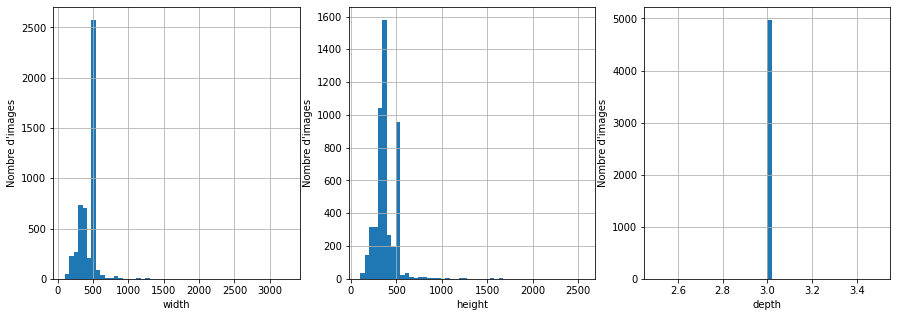

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15,5))
for i, par in enumerate(['width', 'height', 'depth']) :
    print(f"{par} : Valeur moyenne = {DATA[par].mean()}")
    DATA[par].hist(ax=axs[i], bins=50)
    axs[i].set_xlabel(par)
    axs[i].set_ylabel("Nombre d'images")
plt.show()

La taille des images est assez variable. Les distributions de la largeur et de la hauteur sont similaires ce qui signifie que nous avons des images en format portraits et paysages.
Toutes les images sont par contre dans le même format RGB avec une profondeur de 3 correspondant à la couleur rouge, vert et bleu.

**Exploration des labels**

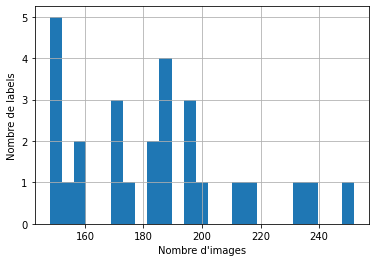

Nombre moyen d'images par label = 184.14814814814815
Nombre median d'images par label = 185.0
Nombre d'images minimum = 148
Nombre d'images maximum = 252


In [ ]:
lab_count = DATA.groupby('labels').size().sort_values(ascending=False)
fig, ax = plt.subplots()
lab_count.hist(bins=25, ax=ax)
ax.set_xlabel("Nombre d'images")
ax.set_ylabel("Nombre de labels")
plt.show()
print(f"Nombre moyen d'images par label = {lab_count.mean()}")
print(f"Nombre median d'images par label = {lab_count.median()}")
print(f"Nombre d'images minimum = {lab_count.min()}")
print(f"Nombre d'images maximum = {lab_count.max()}")

On observe que toutes les races de chiens possèdent au minimum 148 images.
La majorité des races ont entre 148 et 185 images (médiane).
Certaines races sont très représentées avec plus de 250 images.

Nombre d'images dans les 5 label les plus remplis = 1155, soit 21.88%
Nombre d'images dans les 10 label les plus remplis = 2130, soit 40.34%
Nombre d'images dans les 20 label les plus remplis = 3909, soit 74.03%
Nombre d'images dans les 30 label les plus remplis = 4972, soit 94.17%


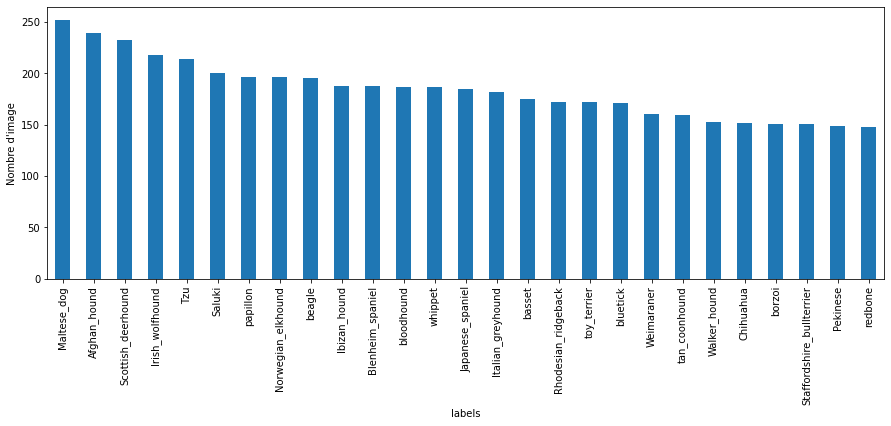

In [ ]:
fig, ax = plt.subplots(figsize=(15,5))
lab_count[:30].plot(kind="bar", ax=ax)
ax.set_ylabel("Nombre d'image")
for n in [5,10,20,30] :
    print(f"Nombre d'images dans les {n} label les plus remplis = {lab_count[:n].sum()}, soit {lab_count[:n].sum()/len(DATA)*100:.2f}%")
plt.show()

Afin de diminuer le nombre d'image en mémoire et d'accélérer les codes de développement de la classification, nous conservons 10 ou 20 races de chiens ce qui correspond à environ 10 ou 20% des images

Maltese_dog


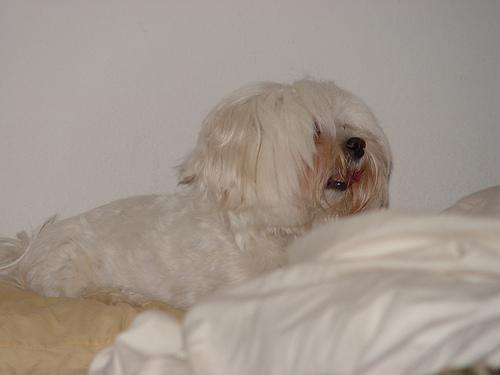

Afghan_hound


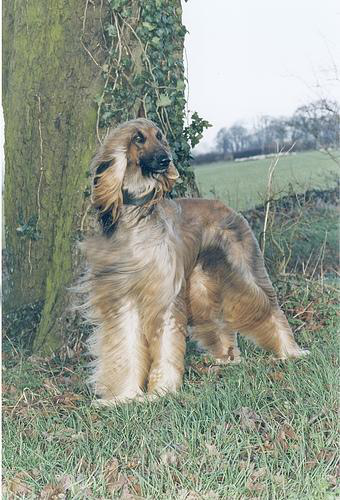

Scottish_deerhound


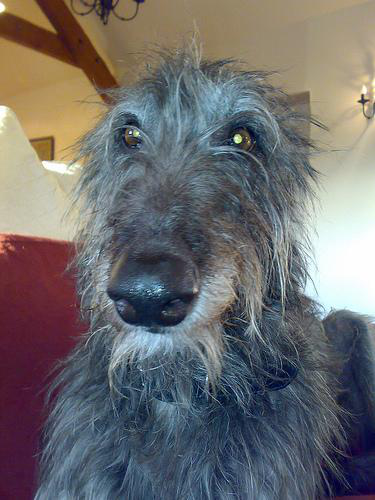

Irish_wolfhound


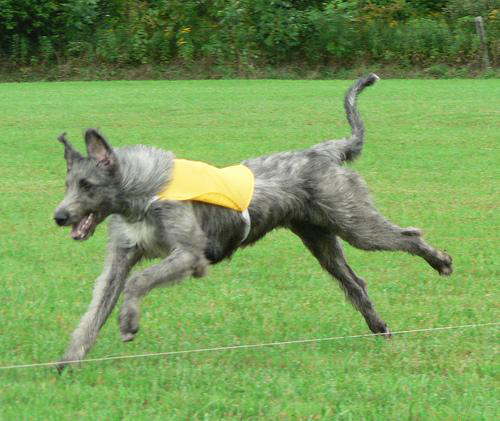

Tzu


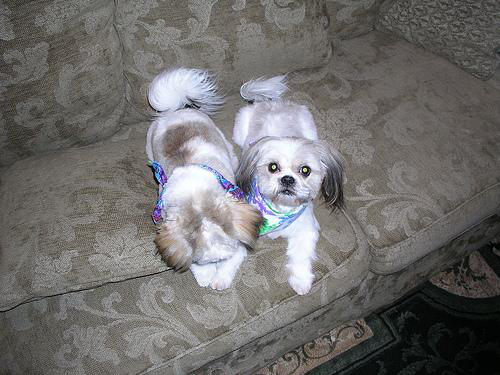

Saluki


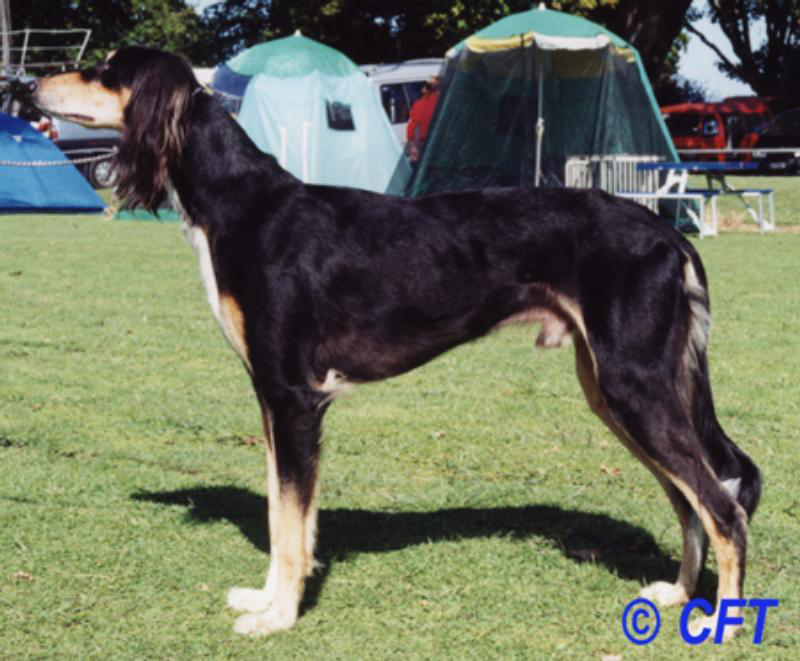

papillon


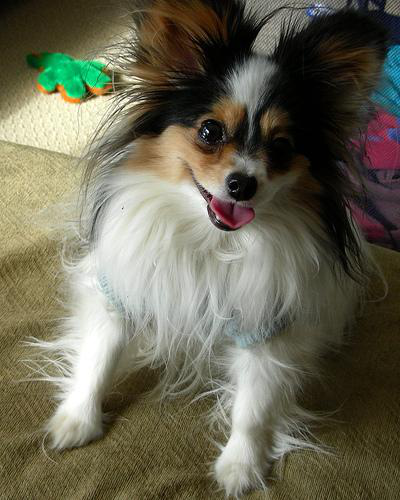

Norwegian_elkhound


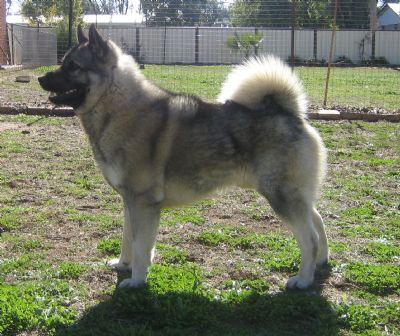

beagle


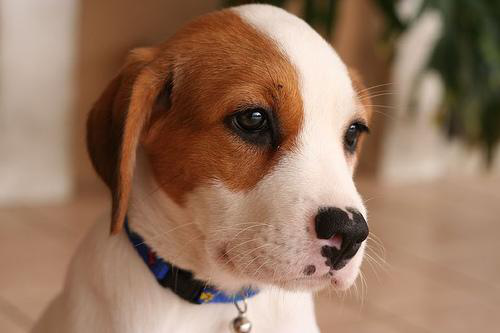

Ibizan_hound


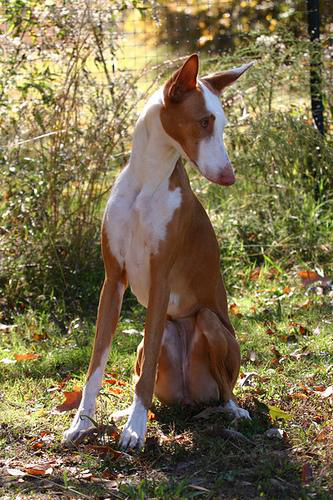

In [ ]:
for label in lab_count[:10].index :
    print("="*50)
    print(label)
    print("="*50)
    tmp = DATA[DATA['labels']==label]
    display(tmp.iloc[np.random.randint(len(tmp))]['image'])
del tmp

**utilisation que des 20 labels les plus fréquents**

Pour limiter les besoins en ressources de la classification, nous conservons uniquement les 20 races de chiens les plus fréquentes dans une logique de développement.



In [ ]:
labels = lab_count[:20].index
print(f"Race de chiens conservées = {labels}")
DATA = DATA[DATA.labels.isin(labels)]
DATA

Race de chiens conservées = Index(['Maltese_dog', 'Afghan_hound', 'Scottish_deerhound', 'Irish_wolfhound',
       'Tzu', 'Saluki', 'papillon', 'Norwegian_elkhound', 'beagle',
       'Ibizan_hound', 'Blenheim_spaniel', 'bloodhound', 'whippet',
       'Japanese_spaniel', 'Italian_greyhound', 'basset',
       'Rhodesian_ridgeback', 'toy_terrier', 'bluetick', 'Weimaraner'],
      dtype='object', name='labels')


,path,labels,image,fname,width,height,depth
152,Images/n02085782-Japanese_spaniel/n02085782_10...,Japanese_spaniel,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085782_1039,500.0,375.0,3.0
153,Images/n02085782-Japanese_spaniel/n02085782_10...,Japanese_spaniel,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085782_1059,550.0,413.0,3.0
154,Images/n02085782-Japanese_spaniel/n02085782_10...,Japanese_spaniel,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085782_1085,260.0,331.0,3.0
155,Images/n02085782-Japanese_spaniel/n02085782_11...,Japanese_spaniel,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085782_1143,220.0,214.0,3.0
156,Images/n02085782-Japanese_spaniel/n02085782_11...,Japanese_spaniel,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085782_1156,640.0,480.0,3.0
...,...,...,...,...,...,...,...
4816,Images/n02092339-Weimaraner/n02092339_767.jpg,Weimaraner,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02092339_767,NaN,NaN,NaN
4817,Images/n02092339-Weimaraner/n02092339_7816.jpg,Weimaraner,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02092339_7816,NaN,NaN,NaN
4818,Images/n02092339-Weimaraner/n02092339_7918.jpg,Weimaraner,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02092339_7918,NaN,NaN,NaN
4819,Images/n02092339-Weimaraner/n02092339_7959.jpg,Weimaraner,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02092339_7959,NaN,NaN,NaN


**Resize des images**

Puisque dans la plupart des cas les algorithmes de classificiation ont besoin d'entrées avec une taille unique, les images du dataset sont redimmensionnées.
La taille choisie est 400*400, afin d'obtenir un carré et de ne tenir compte de l'orientation de l'image.

In [ ]:
DATA['image'] = DATA['image'].apply(lambda x : x.resize((400,400)))

**SIFT**

SIFT est une méthode permettant d'identifier des zones d'intérets sur une image et d'extraire un descripteur pour chaque zone.
Ces descripteurs peuvent ensuite être utilisés en entrée d'un classifieur.

**Conversion en noir et blanc**

In [ ]:
DATA['image_gray'] = DATA['image'].apply(lambda x: cv2.cvtColor(np.array(x), cv2.COLOR_BGR2GRAY))

**Calcul des features SIFT**

In [ ]:
# create SIFT feature extractor
sift = cv2.xfeatures2d.SIFT_create()

keypoints, descriptors = [], []
for i, img in enumerate(DATA['image']) :
    print(f"{i}/{len(DATA)}", end='\r')
    key, desc =  sift.detectAndCompute(np.array(img), None)
    keypoints.append(key)
    descriptors.append(desc)

In [ ]:
DATA['descriptors'] = descriptors
DATA['keypoints'] = keypoints

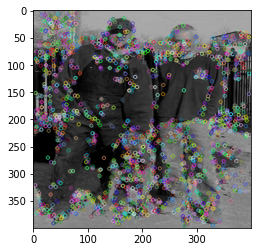

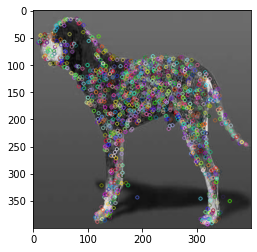

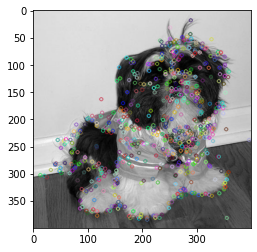

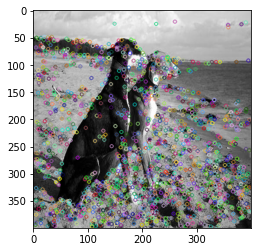

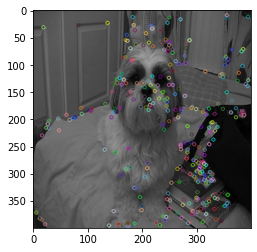

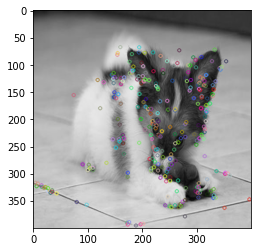

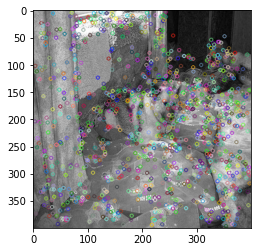

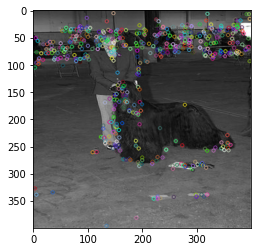

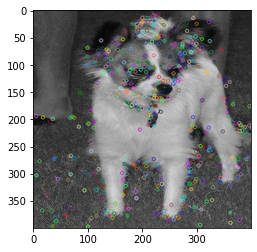

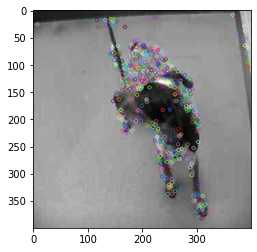

In [ ]:
nimg = np.random.randint(low=0, high=len(DATA), size=10)
for n in nimg :
    dat = DATA.iloc[n]
    sift_image = cv2.drawKeypoints(dat['image_gray'], dat['keypoints'], np.array(dat['image']))
    plt.imshow(sift_image)
    plt.show()

On remarque que le nombre de points d'intérêts est variable selon les images. Cela signifie qu'il faut un traitement supplémentaire afin d'utiliser ces descripteurs en entrée d'un modèle (conservation de la taille des inputs).
On remarque également que les zones d'intérêts ne se trouvent pas forcément sur le chien, mais parfois dans le décor. Ces descripteurs ne semblent pas donc pas être important pour séparer les races de chiens.

**encodage des labels**

In [ ]:
encoder = LabelEncoder()
encoder.fit(DATA['labels'])
DATA['int_labels'] = encoder.transform(DATA['labels'])
DATA.head()

,path,labels,image,fname,width,height,depth,image_gray,descriptors,keypoints,int_labels
152,Images/n02085782-Japanese_spaniel/n02085782_10...,Japanese_spaniel,<PIL.Image.Image image mode=RGB size=400x400 a...,n02085782_1039,500.0,375.0,3.0,"[[140, 142, 144, 144, 143, 140, 132, 133, 140,...","[[0.0, 121.0, 51.0, 1.0, 1.0, 0.0, 0.0, 0.0, 7...","(< cv2.KeyPoint 0x7f5f6301b180>, < cv2.KeyPoin...",5
153,Images/n02085782-Japanese_spaniel/n02085782_10...,Japanese_spaniel,<PIL.Image.Image image mode=RGB size=400x400 a...,n02085782_1059,550.0,413.0,3.0,"[[21, 24, 25, 24, 24, 25, 26, 28, 27, 25, 28, ...","[[7.0, 2.0, 4.0, 21.0, 20.0, 9.0, 0.0, 3.0, 61...","(< cv2.KeyPoint 0x7f5f5f0886c0>, < cv2.KeyPoin...",5
154,Images/n02085782-Japanese_spaniel/n02085782_10...,Japanese_spaniel,<PIL.Image.Image image mode=RGB size=400x400 a...,n02085782_1085,260.0,331.0,3.0,"[[28, 25, 18, 13, 10, 7, 11, 10, 7, 7, 7, 8, 9...","[[77.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 210...","(< cv2.KeyPoint 0x7f5f5f08d4e0>, < cv2.KeyPoin...",5
155,Images/n02085782-Japanese_spaniel/n02085782_11...,Japanese_spaniel,<PIL.Image.Image image mode=RGB size=400x400 a...,n02085782_1143,220.0,214.0,3.0,"[[59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, ...","[[1.0, 0.0, 1.0, 9.0, 16.0, 4.0, 2.0, 4.0, 71....","(< cv2.KeyPoint 0x7f5f5f012870>, < cv2.KeyPoin...",5
156,Images/n02085782-Japanese_spaniel/n02085782_11...,Japanese_spaniel,<PIL.Image.Image image mode=RGB size=400x400 a...,n02085782_1156,640.0,480.0,3.0,"[[113, 119, 129, 134, 133, 133, 132, 128, 112,...","[[184.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 2...","(< cv2.KeyPoint 0x7f5f5f01c1e0>, < cv2.KeyPoin...",5


### Echantillonnage de la base de données

**Séparation jeu d'apprentissage et de test**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(DATA, DATA['int_labels'], test_size=0.2, random_state=42,
                                                   stratify=DATA['int_labels'])

In [ ]:
print(f"Nombre d'images dans le train set = {X_train.shape[0]}")
print(f"Nombre d'images dans le train set = {X_test.shape[0]}")

Nombre d'images dans le train set = 3127
Nombre d'images dans le train set = 782


###  Visualisation de l'espace mémoire

In [ ]:
import sys

ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']
sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)


[('DATA', 2814076287),
 ('X_train', 2244893834),
 ('X_test', 569182485),
 ('desc', 481912),
 ('sift_image', 480136),
 ('dat', 389517),
 ('y_train', 50064),
 ('descriptors', 33936),
 ('keypoints', 33936),
 ('y_test', 12544),
 ('f', 8376),
 ('key', 7584),
 ('lab_count', 4512),
 ('labels', 2397),
 ('KNeighborsClassifier', 1064),
 ('LabelEncoder', 1064),
 ('meta', 376),
 ('members', 208),
 ('nimg', 184),
 ('autocontrast', 144),
 ('equalize', 144),
 ('train_test_split', 144),
 ('label', 113),
 ('axs', 104),
 ('ImageFilter', 88),
 ('drive', 88),
 ('np', 88),
 ('pd', 88),
 ('plt', 88),
 ('par', 78),
 ('lab', 74),
 ('ax', 64),
 ('encoder', 64),
 ('fig', 64),
 ('img', 64),
 ('tar_annot', 64),
 ('tar_images', 64),
 ('fname', 62),
 ('n', 32),
 ('sift', 32),
 ('i', 28),
 ('imax', 28)]

### transformation images

A titre d'exemple, on applique des corrections sur un jeu d'images de taille limitée

In [ ]:
img = np.random.randint(low=0, high=len(DATA), size=10)
img

array([1256,  452, 1637, 2186, 2360,  103, 2976, 1779, 1317, 1802])

### Correction luminosité
pour corriger la luminosité on applique un étirement sur l'histogramme par une règle de 3.

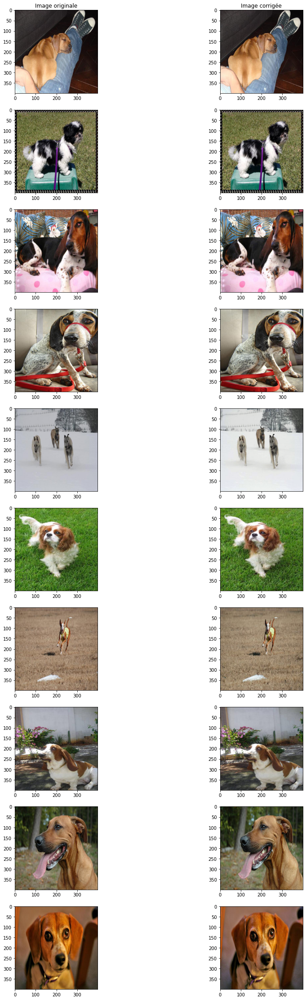

In [ ]:
fig, axs = plt.subplots(ncols=2, nrows=len(img), figsize=(15,40))
for i, nimg in enumerate(img) :
    axs[i,0].imshow(DATA.iloc[nimg]['image'])
    axs[i,1].imshow(autocontrast(DATA.iloc[nimg]['image']))
axs[0,0].title.set_text('Image originale')
axs[0,1].title.set_text('Image corrigée')
plt.show()

### Egalisation d'histogramme

Pour corriger les différence d'intensité entre le point le plus sombre et le clair.
La correction permet de normaliser la distribution des couleurs pour que chaque niveau contienne le même nombre de pixel.

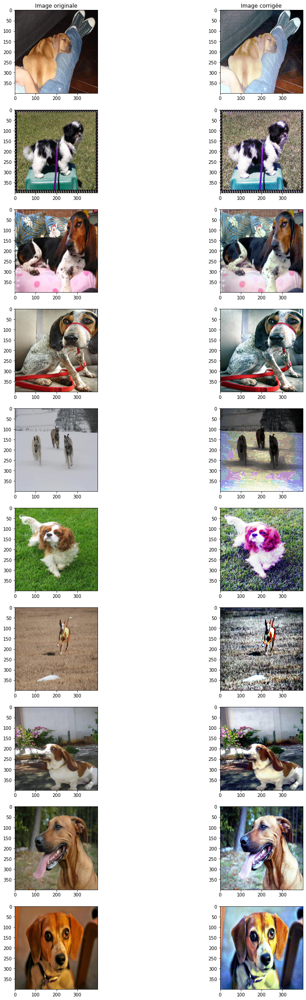

In [ ]:
fig, axs = plt.subplots(ncols=2, nrows=len(img), figsize=(15,40))
for i, nimg in enumerate(img) :
    axs[i,0].imshow(DATA.iloc[nimg]['image'])
    axs[i,1].imshow(equalize(DATA.iloc[nimg]['image']))
axs[0,0].title.set_text('Image originale')
axs[0,1].title.set_text('Image corrigée')
plt.show()

### Débruitage

La manière la plus efficace de réduction du bruit aléatoire est l'application d'une fonction gaussienne sur les niveau de couleur.
L"application d'une gaussienne provoque une image plus flou.

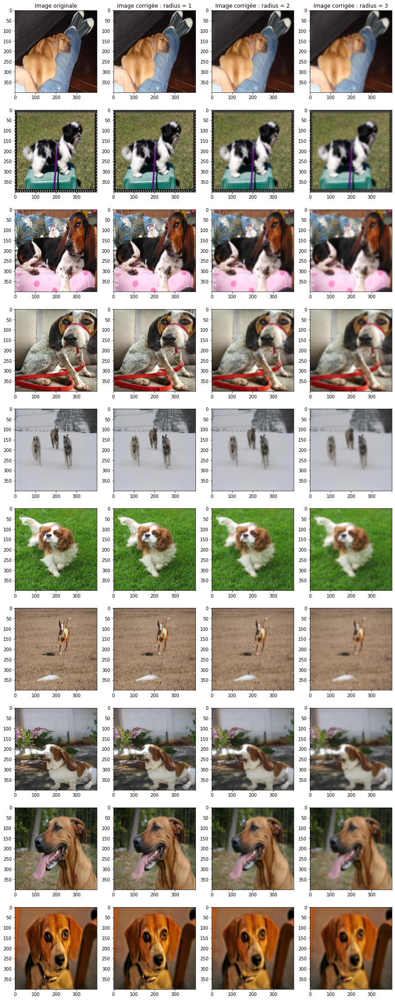

In [ ]:
fig, axs = plt.subplots(ncols=4, nrows=len(img), figsize=(15,40))
for i, nimg in enumerate(img) :
    axs[i,0].imshow(DATA.iloc[nimg]['image'])
    for j, rad in enumerate([1,2,3]): 
        axs[i,j+1].imshow(DATA.iloc[nimg]['image'].filter(ImageFilter.GaussianBlur(radius=rad)))
axs[0,0].title.set_text('Image originale')
for j, rad in enumerate([1,2,3]): 
    axs[0,j+1].title.set_text(f'Image corrigée : radius = {rad}')
plt.show()
#DATA['image_nonoise'] = DATA['image'].apply(lambda x : x.filter(ImageFilter.GaussianBlur(radius=0.5)))